In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict
file_data = '/Users/cemalarican/Desktop/THESIS/PART 1/MOVING_WINDOW/'
file_main_data = '/Users/cemalarican/Desktop/THESIS/PART 1/MOVING_WINDOW/MAIN_DATA_MOVING_WINDOW/'

windows = [15, 30, 45, 60, 90, 120, 252]

# before the swap: stock1 actually equals stock2
coint_pairs = pd.read_csv('/Users/cemalarican/Desktop/THESIS/pairs_to_investigate.csv')

import sys  
sys.path.insert(0, '/Users/cemalarican/Desktop/THESIS/')

from pipeLine import Pipeline

In [2]:
data = pd.DataFrame()

# originally 239
for window in windows:
    data['perf_' + str(window)] = pd.read_csv(file_data + 'pair_sim_window_' + str(window)+'.csv').iloc[-1]

data.drop('Unnamed: 0', inplace=True)

idx = list(data.index)

# MAIN DATA
for window in windows:
    d =  pd.read_csv(file_main_data + '/pair_sim_window_'+ str(window) +'.csv').groupby('symbol')
    alphas = []
    betas = []
    sharpes = []
    maxes = []
    for i in range(239):
        
        stock_alpha = d.get_group(idx[i]).alpha.iloc[-1]
        stock_beta = d.get_group(idx[i]).beta.iloc[-1]
        stock_sharpe = d.get_group(idx[i]).sharpe.iloc[-1]
        stock_max = d.get_group(idx[i]).max_drawdown.iloc[-1]
        alphas.append(stock_alpha)
        betas.append(stock_beta)
        sharpes.append(stock_sharpe)
        maxes.append(stock_max)

    data['alpha_' + str(window)] = alphas
    data['beta_' + str(window)] = betas
    data['sharpe_' + str(window)] = sharpes
    data['maxdraw_' + str(window)] = maxes


data['STAT'] = [list(data.index)[i].split(':')[1] for i in range(len(data)) ]

for window in windows:
    data['pct_'+str(window)] = (data['perf_' +str(window)]/100000) -1
    
data

/opt/anaconda3/envs/zipline/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2714: DtypeWarning: Columns (12,13,15,18,35,43) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,perf_15,perf_30,perf_45,perf_60,perf_90,perf_120,perf_252,alpha_15,beta_15,sharpe_15,...,sharpe_252,maxdraw_252,STAT,pct_15,pct_30,pct_45,pct_60,pct_90,pct_120,pct_252
MZZ vs SMDD:NON-STAT,-125276,90992.4,65834.7,107298,128911,103825,93876.8,4.090584,25.033642,0.306193,...,0.178327,-0.323926,NON-STAT,-2.25276,-0.0900762,-0.341653,0.0729773,0.289113,0.0382537,-0.061232
EDV vs UBT:NON-STAT,102002,103429,102810,100019,102376,98786.7,100598,0.021147,-0.032479,0.623091,...,0.265058,-0.014245,NON-STAT,0.0200223,0.0342922,0.0281017,0.00019492,0.0237566,-0.0121334,0.0059759
IVV vs IWB:STAT,101123,100549,101510,103594,104789,101709,102870,0.010271,0.076252,0.276877,...,0.666994,-0.022593,STAT,0.0112325,0.00549107,0.0150975,0.0359392,0.047885,0.0170876,0.0286979
DGL vs SGOL:STAT,97249.6,125451,92173.4,98497.8,104194,101337,98329.1,-0.026487,0.076501,-0.304573,...,-0.201966,-0.070601,STAT,-0.0275038,0.254512,-0.0782656,-0.0150223,0.0419366,0.0133672,-0.0167094
PHDG vs VQT:STAT,96907,97170.6,96396.6,96360.2,95287.7,94823.3,96235.5,-0.031655,0.081735,-0.500669,...,-0.664951,-0.085166,STAT,-0.0309303,-0.0282938,-0.0360338,-0.0363978,-0.0471232,-0.0517667,-0.0376452
IWV vs SCHB:NON-STAT,109418,102958,104001,101936,101186,99809,106431,0.088551,0.128174,1.595697,...,1.156541,-0.032453,NON-STAT,0.0941835,0.0295813,0.0400111,0.0193563,0.0118622,-0.00191025,0.0643068
IWB vs SPY:STAT,100079,103031,106314,102433,105510,103624,103724,-0.001498,0.137508,0.040050,...,0.860830,-0.021963,STAT,0.00078777,0.0303061,0.0631392,0.0243258,0.0551022,0.0362371,0.0372364
IWB vs SSO:STAT,47661,47090.2,49148.9,50177.7,112473,103044,100973,-0.520624,0.344092,-0.953657,...,0.168370,-0.053186,STAT,-0.52339,-0.529098,-0.508511,-0.498223,0.124729,0.0304428,0.00973237
CURE vs RXL:STAT,281852,254732,222690,236080,201152,223239,223659,1.438760,0.252674,1.223075,...,0.923333,-0.137857,STAT,1.81852,1.54732,1.2269,1.3608,1.01152,1.23239,1.23659
EUSA vs VV:STAT,110391,100399,112089,113082,108811,104301,104627,0.103506,0.036744,0.988740,...,0.737018,-0.029841,STAT,0.103914,0.00399206,0.120891,0.130823,0.0881089,0.0430096,0.046267


In [3]:
pnl_data_1 = pd.DataFrame()
pnl_data_2 = pd.DataFrame()
pnl_data_3 = pd.DataFrame()
pnl_data_4 = pd.DataFrame()
pnl_data_5 = pd.DataFrame()
pnl_data_6 = pd.DataFrame()
pnl_data_7 = pd.DataFrame()
tickers = list(data.index)

def get_pnl(mw, dbase, mw_base):
    d = pd.read_csv(file_main_data + 'pair_sim_window_' + str(mw) + '.csv', low_memory=False)
    dg = d.groupby('symbol')
    tickers = list(data.index)
    for i in range(len(dbase)):
        mw_base[tickers[i]] = dg.get_group(tickers[i]).pnl.reset_index(drop=True)
    return mw_base

def get_pnl_list(pnl_data, mw):
    list_of_pnl = []
    for i in range(len(coint_pairs)):
        tick = pd.DataFrame()
        tick['data'] = pnl_data[tickers[i]]
        tick['pos'] = pnl_data[tickers[i]] > 0

        neg = tick.groupby('pos').get_group(False)
        try:
            pos = tick.groupby('pos').get_group(True)
        except KeyError:
            pass

        neg_len = len(neg)
        pos_len = len(pos)

        neg_mean = neg['data'].mean()
        pos_mean = pos['data'].mean()

        whole_avg = pnl_data[tickers[i]].mean()

        r = (tickers[i], neg_len, pos_len, neg_mean, pos_mean, whole_avg, data['perf_'+str(mw)].iloc[i])
        list_of_pnl.append(r)

    return list_of_pnl        


def make_df_pnl(pnl_list, mw):
    df = pd.DataFrame(data=pnl_list, columns=['pair', 'no_loss', 'no_win', 'avg_loss', 'avg_win', 'whole_avg', 'perf_'+str(mw)])
    df.set_index('pair', inplace=True)
    s = list(df.index)
    df['stat'] = [s[i].split(':')[1] for i in range(len(s))]
    df['pos_avg'] = df.whole_avg > 0
    df['win'] = df['perf_'+ str(mw)] > 100000
    tot_days = df['no_loss'] + df['no_win']
    df['loss_percent'] = round(df['no_loss']/tot_days, 2)
    df['win_percent'] = round(df['no_win']/tot_days, 2)
    
    return df[df['perf_'+str(mw)] != 100000]


pnl_1 = get_pnl(15,  data, pnl_data_1)
pnl_2 = get_pnl(30,  data, pnl_data_2)
pnl_3 = get_pnl(45,  data, pnl_data_3)
pnl_4 = get_pnl(60,  data, pnl_data_4)
pnl_5 = get_pnl(90,  data, pnl_data_5)
pnl_6 = get_pnl(120, data, pnl_data_6)
pnl_7 = get_pnl(252, data, pnl_data_7)


list_1 = get_pnl_list(pnl_1, 15)
list_2 = get_pnl_list(pnl_2, 30)
list_3 = get_pnl_list(pnl_3, 45)
list_4 = get_pnl_list(pnl_4, 60)
list_5 = get_pnl_list(pnl_5, 90)
list_6 = get_pnl_list(pnl_6, 120)
list_7 = get_pnl_list(pnl_7, 252)


df_1 = make_df_pnl(list_1, 15)
df_2 = make_df_pnl(list_2, 30)
df_3 = make_df_pnl(list_3, 45)
df_4 = make_df_pnl(list_4, 60)
df_5 = make_df_pnl(list_5, 90)
df_6 = make_df_pnl(list_6, 120)
df_7 = make_df_pnl(list_7, 252)



def get_tables(data, mw):
    
    cols = ['no_loss', 'no_win', 'avg_loss','avg_win', 'whole_avg', 'perf_' + str(mw), 'loss_percent', 'win_percent']
    
    avg_list = [list(round(data[cols].mean(), 2).reset_index(drop=True))[i] for i in range(8)]
    
    stat_list = list(round(data.groupby('stat').get_group('STAT')[cols].mean(), 2))
    
    nstat_list = list(round(data.groupby('stat').get_group('NON-STAT')[cols].mean(), 2))
    
    stat = data.groupby('stat').get_group('STAT')
    
    win_stat = list(round(stat.groupby('win').get_group(True)[cols].mean(), 2))
    
    nstat = data.groupby('stat').get_group('NON-STAT')
    
    win_nstat = list(round(nstat.groupby('win').get_group(True)[cols].mean(), 2))
    
    df_list = [avg_list, stat_list, nstat_list, win_stat, win_nstat]
    
    index = ['avg', 'avg stat', 'avg non-stat', 'avg winning stat', 'avg winning non-stat']
    
    list_to_df =  pd.DataFrame(data=df_list, columns=cols, index=index)
    list_to_df.to_latex(buf=file_data + str(mw)+' daily returns mw.txt', index=True)
    print(list_to_df)
    

get_tables(df_1, 15)
get_tables(df_2, 30)
get_tables(df_3, 45)
get_tables(df_4, 60)
get_tables(df_5, 90)
get_tables(df_6, 120)
get_tables(df_7, 252)


                      no_loss  no_win  avg_loss  avg_win  whole_avg  \
avg                    140.40  113.23  -3072.20  3398.35      81.14   
avg stat               141.72  112.63  -3959.71  4403.75     150.46   
avg non-stat           137.40  114.60  -1045.71  1102.69     -77.13   
avg winning stat       132.65  119.35  -7833.41  8958.53     601.01   
avg winning non-stat   130.48  121.52   -545.09   727.72      75.55   

                        perf_15  loss_percent  win_percent  
avg                   120448.44          0.55         0.45  
avg stat              137916.75          0.56         0.44  
avg non-stat           80562.47          0.55         0.45  
avg winning stat      251454.55          0.53         0.47  
avg winning non-stat  119039.82          0.52         0.48  
                      no_loss  no_win  avg_loss  avg_win  whole_avg  \
avg                    143.70  110.12  -2266.60  2691.47      15.06   
avg stat               144.87  109.74  -2913.02  3497.56      56.

In [ ]:
# We remove the pairs that are not traded: 202 left over
data = data[data['perf_15'] != 100000]

In [5]:
data_group = data.groupby('STAT')
stat_data = data_group.get_group('STAT')
nstat_data = data_group.get_group('NON-STAT')
print('number of stat: {}'.format(len(stat_data)))
print('number of nstat: {}'.format(len(nstat_data)))

number of stat: 142
number of nstat: 61


In [4]:
### GETTING AVERAGE RESULTS ###
average_perf = OrderedDict()
pct_mean = OrderedDict()
pct_std = OrderedDict()
alpha_mean = OrderedDict()
beta_mean = OrderedDict()
sharpe_mean = OrderedDict()
maxdraw_mean= OrderedDict()

best_20_perf = OrderedDict()
worst_20_perf = OrderedDict()

data_len = len(data)

for window in windows:
    average_perf[window] = round(data['perf_' + str(window)].mean(), 2)
    pct_mean[window] = round(data['pct_' + str(window)].mean(), 2)
    pct_std[window] = round(data['pct_'+str(window)].std(), 2)
    alpha_mean[window] = round(data['alpha_' + str(window)].mean(), 2)
    beta_mean[window] = round(data['beta_' + str(window)].mean(), 2)
    sharpe_mean[window] = round(data['sharpe_' + str(window)].mean(), 2)
    maxdraw_mean[window] = round(data['maxdraw_'+str(window)].mean(), 2)
    
    d = pd.read_csv(file_data + '/pair_sim_window_' + str(window)+'.csv')
    best_idx = [data['perf_'+str(window)].sort_values()[data_len-20:data_len].index[i] for i in range(20)]
    worst_idx = [data['perf_'+str(window)].sort_values()[:20].index[i] for i in range(20)]
    
    best_20_perf[window] = [(best_idx[i], d[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_perf[window] = [(worst_idx[i], d[worst_idx[i]]) for i in range(len(worst_idx))]

colnames = ['average portfolio value', 'average percentage change', 'average standard deviation',
            'average alpha', 'average beta', 'average sharpe ratio', 'average max drawdown']

list_of_dicts = [average_perf, pct_mean, pct_std,
                 alpha_mean, beta_mean, sharpe_mean, maxdraw_mean ]

main_df = pd.DataFrame()
main_df['window'] = pd.Series(windows)

for i in range(len(list_of_dicts)):
    df = pd.DataFrame(data=list(list_of_dicts[i].items()) , columns=['window', colnames[i]] )
    main_df = pd.concat([main_df, df[colnames[i]]], axis=1)
main_df.to_latex(buf=file_data+'average-perf.txt', index=False)



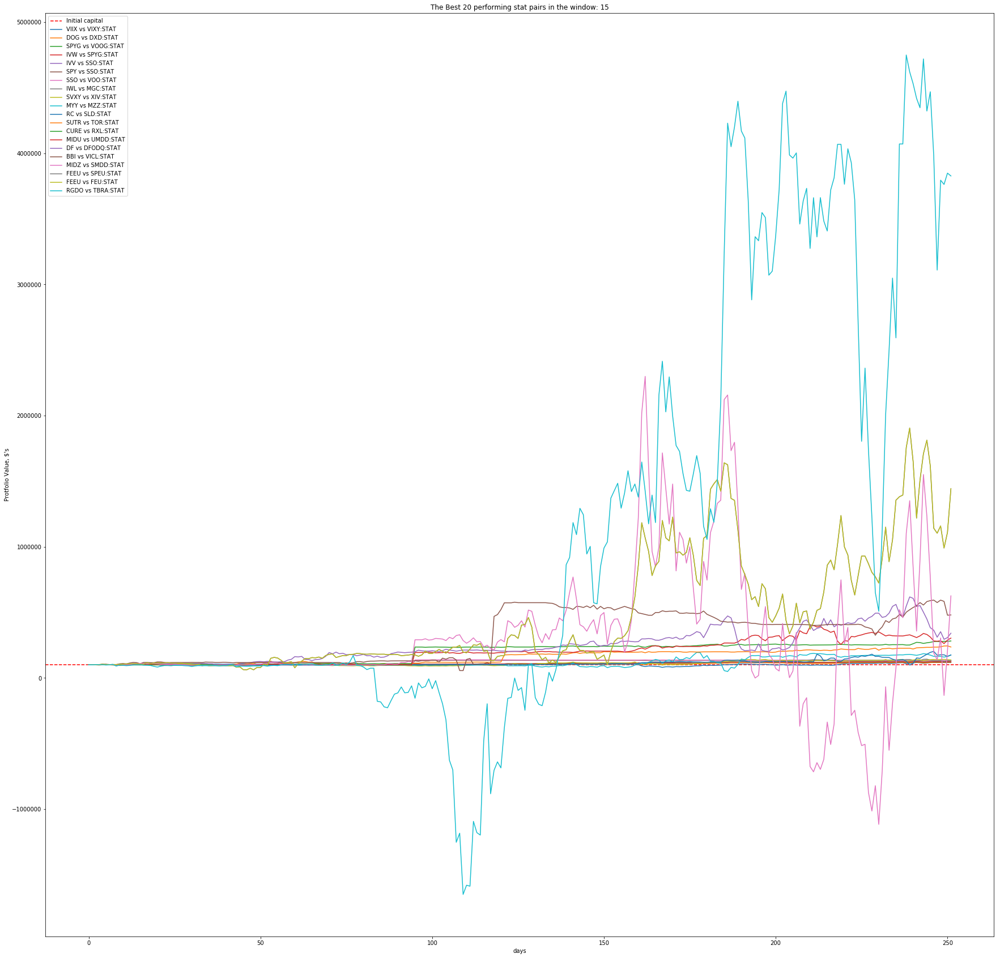

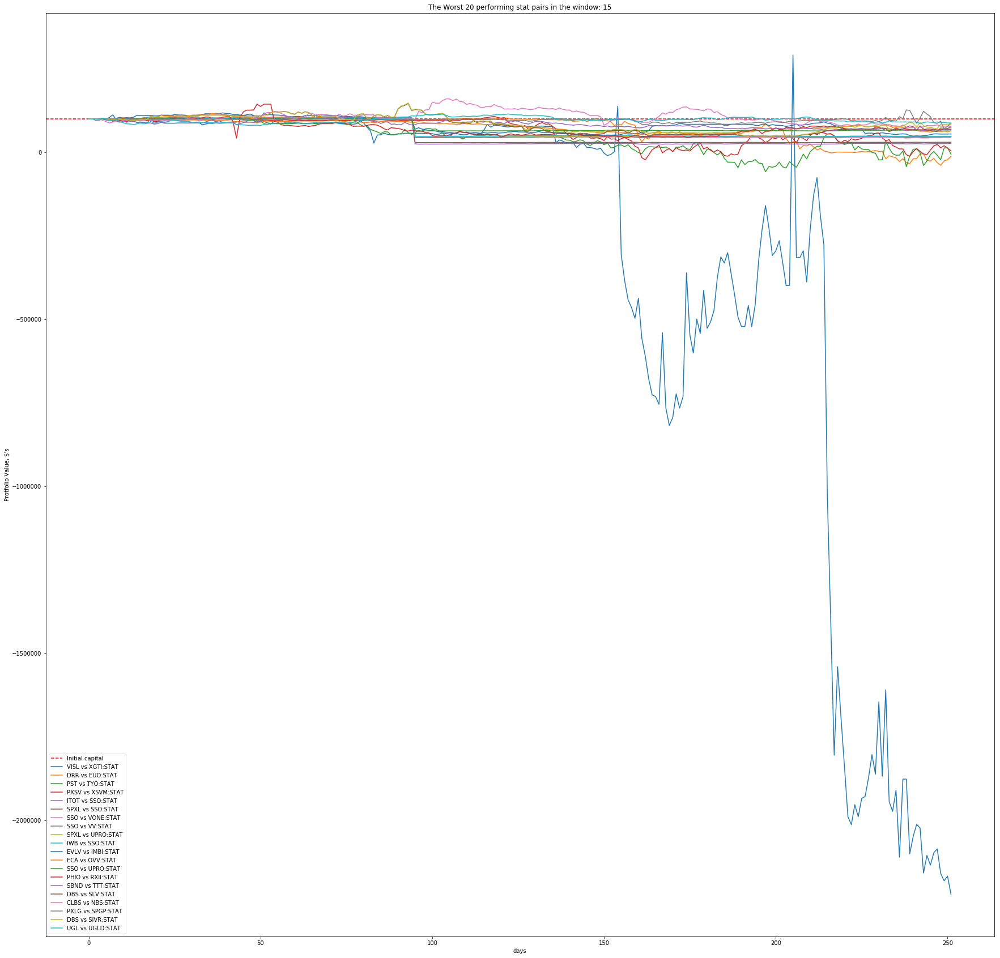

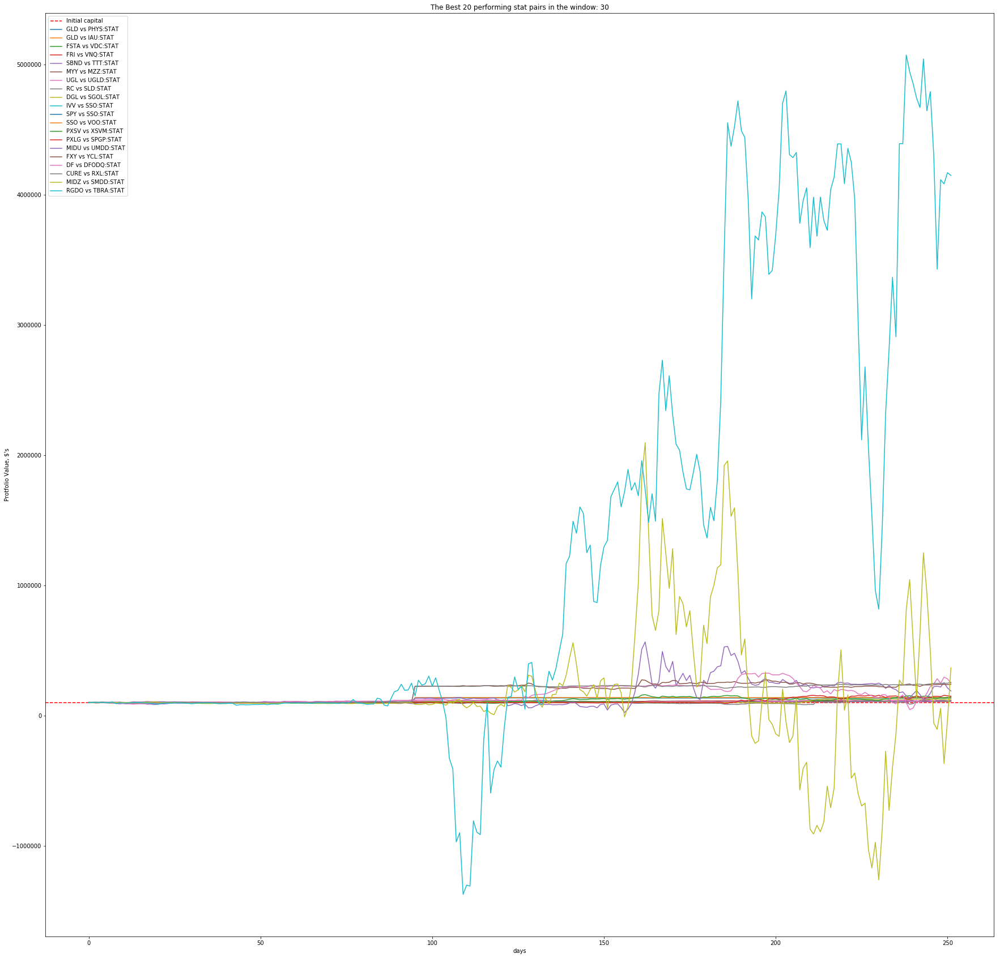

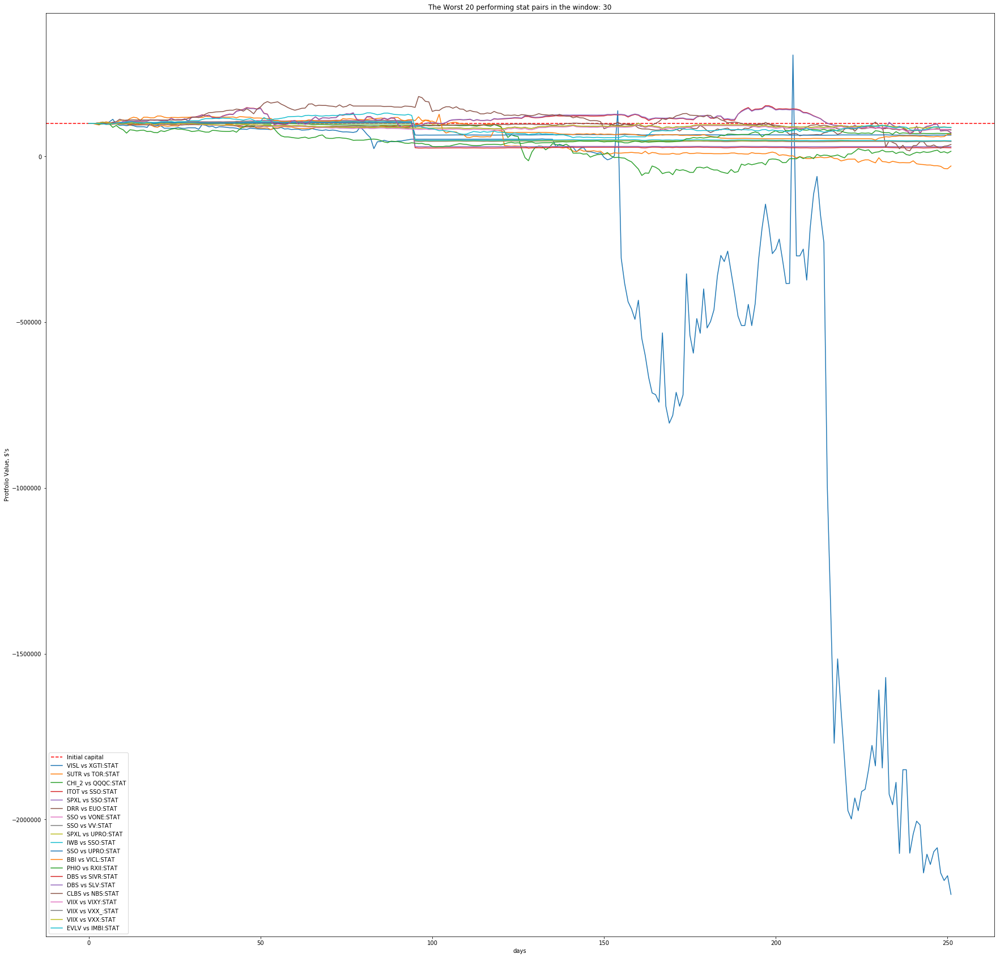

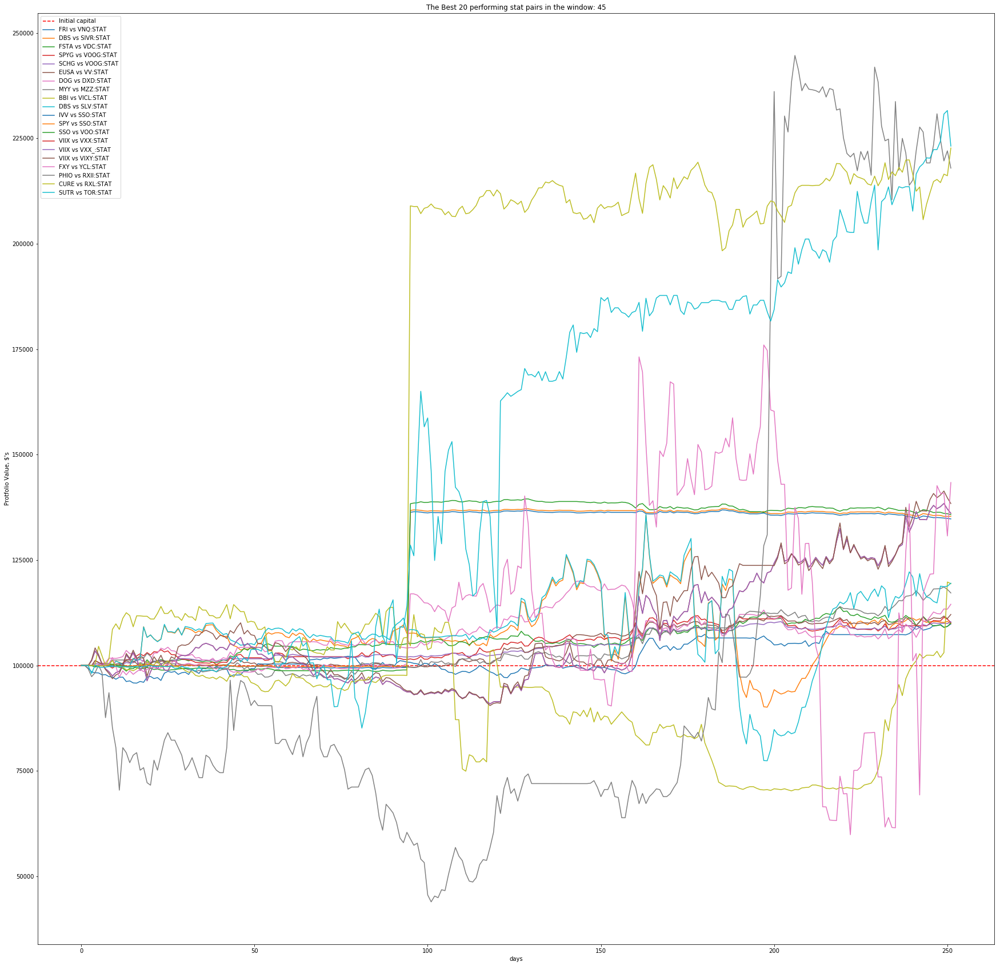

...

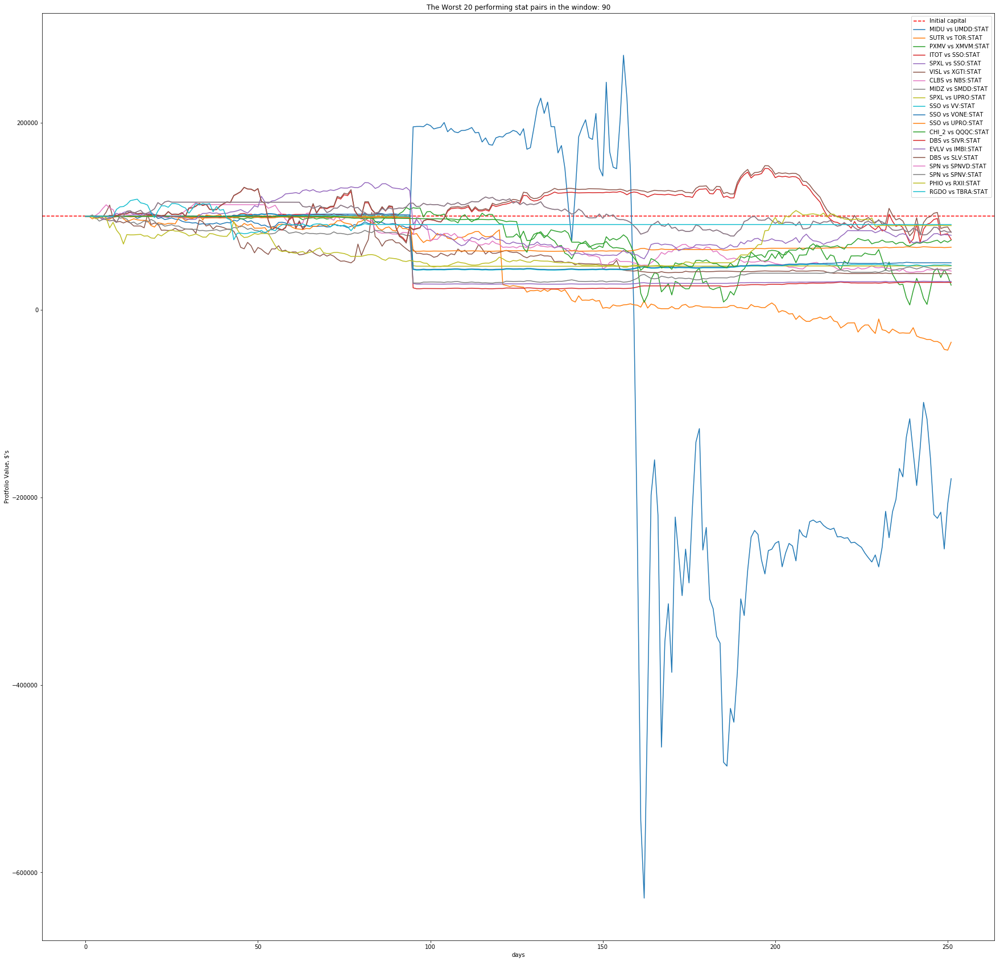

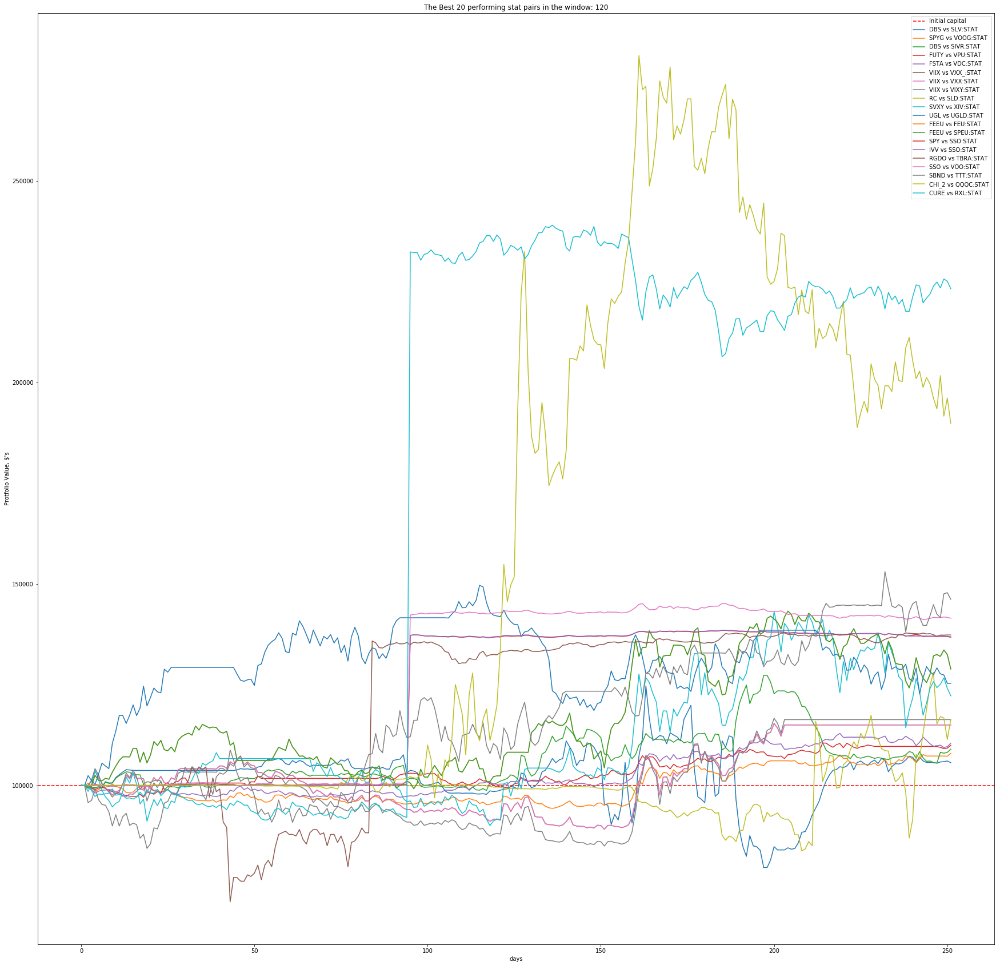

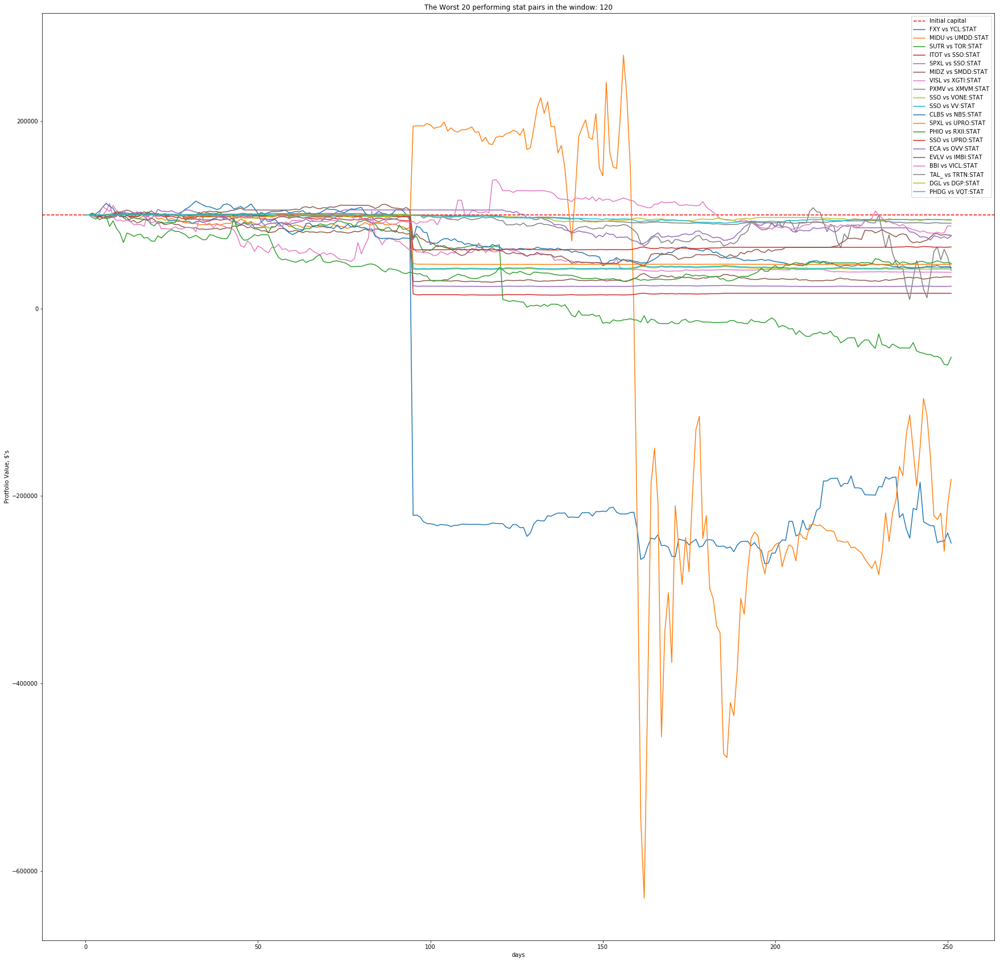

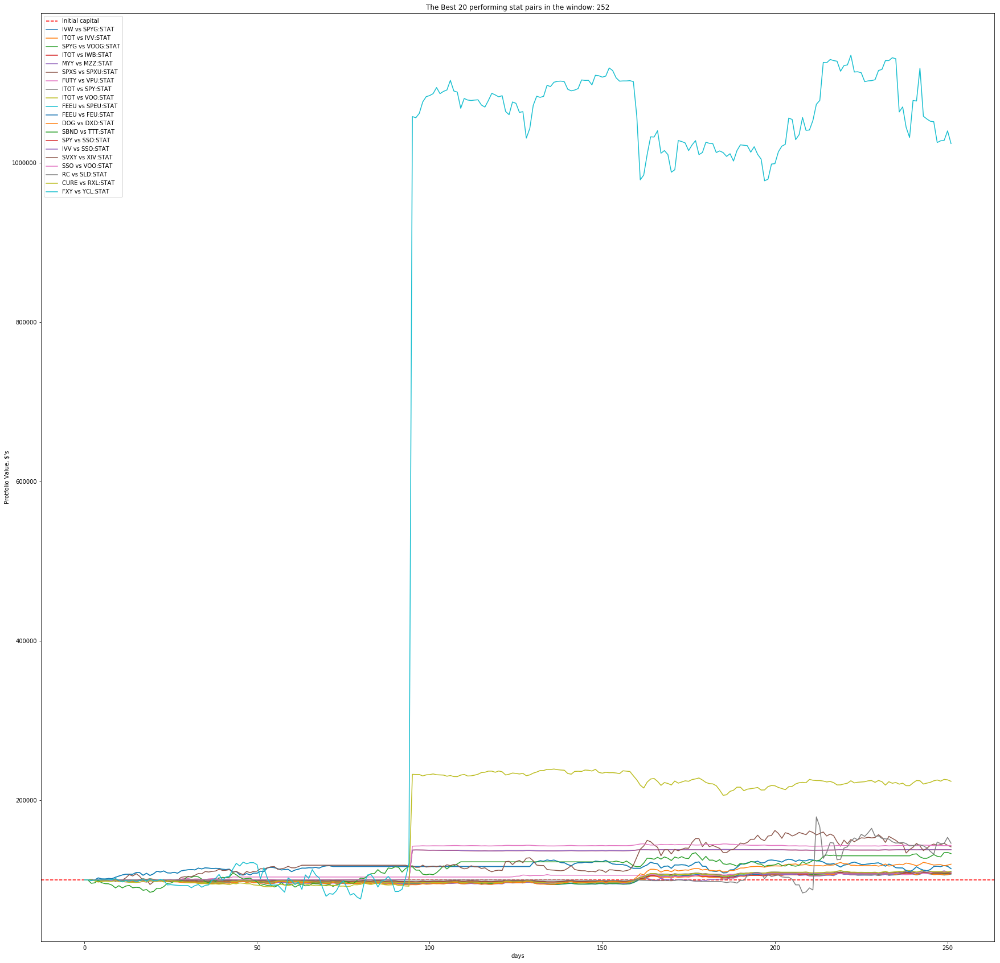

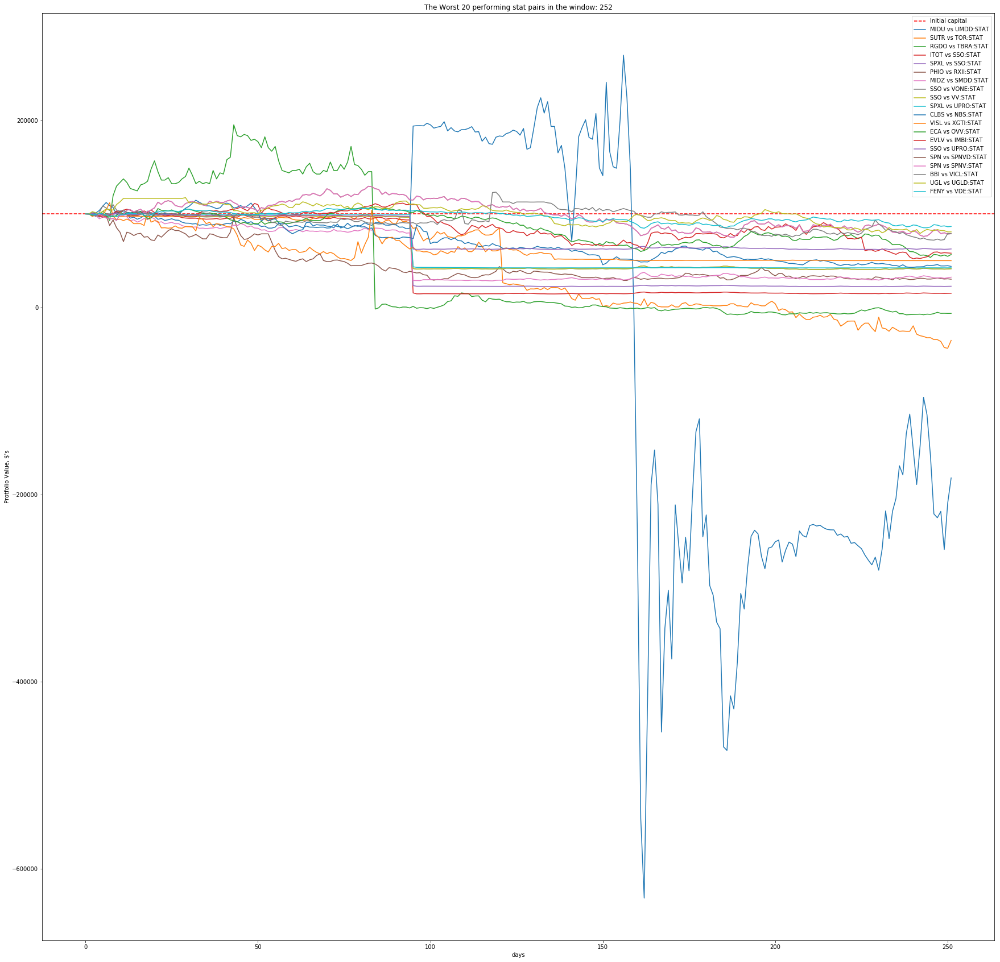

In [5]:
### GETTING STAT AVERAGE RESULTS ### 
stat_average_perf = OrderedDict()
stat_pct_mean = OrderedDict()
stat_pct_std = OrderedDict()
stat_alpha_mean = OrderedDict()
stat_beta_mean = OrderedDict()
stat_sharpe_mean = OrderedDict()
stat_maxdraw_mean = OrderedDict()


best_20_perf_stat = OrderedDict()
worst_20_perf_stat = OrderedDict()

best_20_alpha_stat = OrderedDict()
best_20_beta_stat = OrderedDict()
best_20_sharpe_stat = OrderedDict()
best_20_maxdraw_stat = OrderedDict()

worst_20_alpha_stat = OrderedDict()
worst_20_beta_stat = OrderedDict()
worst_20_sharpe_stat = OrderedDict()
worst_20_maxdraw_stat = OrderedDict()

data_len_stat = len(stat_data)

for window in windows:
    stat_average_perf[window] = round(stat_data['perf_' + str(window)].mean(), 2)
    stat_pct_mean[window] = round(stat_data['pct_' + str(window)].mean(), 2)
    stat_pct_std[window] = round(stat_data['pct_'+str(window)].std(), 2)
    stat_alpha_mean[window] = round(stat_data['alpha_' + str(window)].mean(), 2)
    stat_beta_mean[window] = round(stat_data['beta_' + str(window)].mean(), 2)
    stat_sharpe_mean[window] = round(stat_data['sharpe_' + str(window)].mean(), 2)
    stat_maxdraw_mean[window] = round(stat_data['maxdraw_' + str(window)].mean(), 2)
    
    d = pd.read_csv(file_data + 'pair_sim_window_' + str(window)+'.csv')
    best_idx = [stat_data['perf_'+str(window)].sort_values()[data_len_stat-20:data_len_stat].index[i] for i in range(20)]
    worst_idx = [stat_data['perf_'+str(window)].sort_values()[:20].index[i] for i in range(20)]
    
    best_20_perf_stat[window] = [(best_idx[i], d[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_perf_stat[window] = [(worst_idx[i], d[worst_idx[i]]) for i in range(len(worst_idx))]
    
    best_20_alpha_stat[window] = [(best_idx[i], stat_data['alpha_' + str(window)].loc[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_alpha_stat[window] = [(worst_idx[i], stat_data['alpha_' + str(window)].loc[worst_idx[i]]) for i in range(len(worst_idx))]
    
    best_20_beta_stat[window] = [(best_idx[i], stat_data['beta_' + str(window)].loc[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_beta_stat[window] = [(worst_idx[i], stat_data['beta_' + str(window)].loc[worst_idx[i]]) for i in range(len(worst_idx))]

    best_20_sharpe_stat[window] = [(best_idx[i], stat_data['sharpe_' + str(window)].loc[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_sharpe_stat[window] = [(worst_idx[i], stat_data['sharpe_' + str(window)].loc[worst_idx[i]]) for i in range(len(worst_idx))]
     
    best_20_maxdraw_stat[window] = [(best_idx[i], stat_data['maxdraw_' + str(window)].loc[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_maxdraw_stat[window] = [(worst_idx[i], stat_data['maxdraw_' + str(window)].loc[best_idx[i]]) for i in range(len(worst_idx))]

colnames = ['average portfolio value', 'average percentage change', 'average standard deviation',
            'average alpha', 'average beta', 'average sharpe ratio', 'average max drawdown']

list_of_dicts = [stat_average_perf,stat_pct_mean, stat_pct_std,
                 stat_alpha_mean, stat_beta_mean,stat_sharpe_mean, stat_maxdraw_mean ]

main_df = pd.DataFrame()
main_df['window'] = pd.Series(windows)

for i in range(len(list_of_dicts)):
    df = pd.DataFrame(data=list(list_of_dicts[i].items()) , columns=['window', colnames[i]] )
    main_df = pd.concat([main_df, df[colnames[i]]], axis=1)
main_df.to_latex(buf=file_data+'stat-perf-windows.txt', index=False)
    

for window in windows:
    fig, ax = plt.subplots(figsize = (30, 30))
    ax.set_ylabel("Protfolio Value, $'s")
    ax.set_xlabel('days')
    plt.axhline(100000, color='red', ls='--', label='Initial capital')
    plt.title('The Best 20 performing stat pairs in the window: {}'.format(window))
    
    for i in range(len(best_20_perf_stat[window])):
        ax.plot(best_20_perf_stat[window][i][1])
    plt.legend(loc='best')
    plt.savefig(fname=file_data + '/PLOTS/STAT/best_20_stat_window_' + str(window) + '.png')
    plt.show()
    
    fig1, ax1 = plt.subplots(figsize = (30, 30))
    ax1.set_ylabel("Protfolio Value, $'s")
    ax1.set_xlabel('days')
    plt.axhline(100000, color='red', ls='--', label='Initial capital')    
    for i in range(len(worst_20_perf_stat[window])):
        ax1.plot(worst_20_perf_stat[window][i][1])
        plt.title('The Worst 20 performing stat pairs in the window: {}'.format(window))
    plt.legend(loc='best')
    plt.savefig(fname=file_data + 'PLOTS/STAT/worst_20_stat_window_' + str(window) + '.png')
    plt.show() 

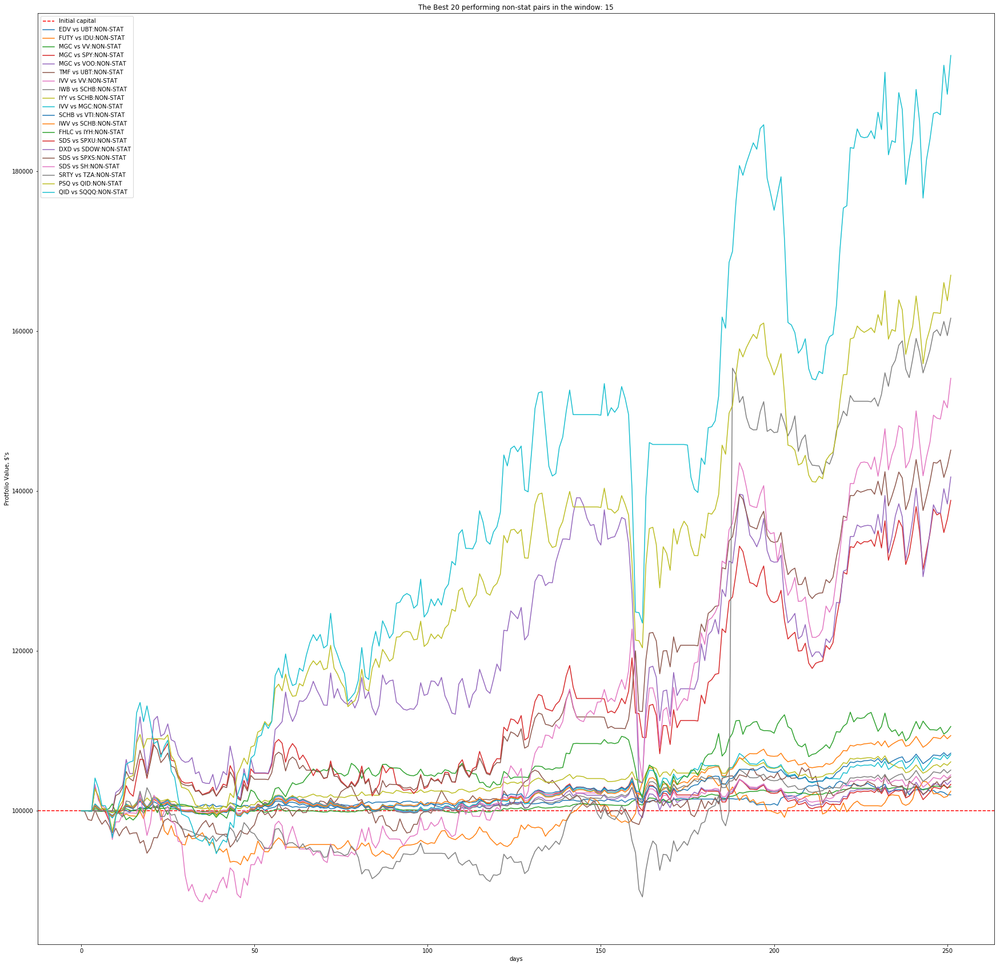

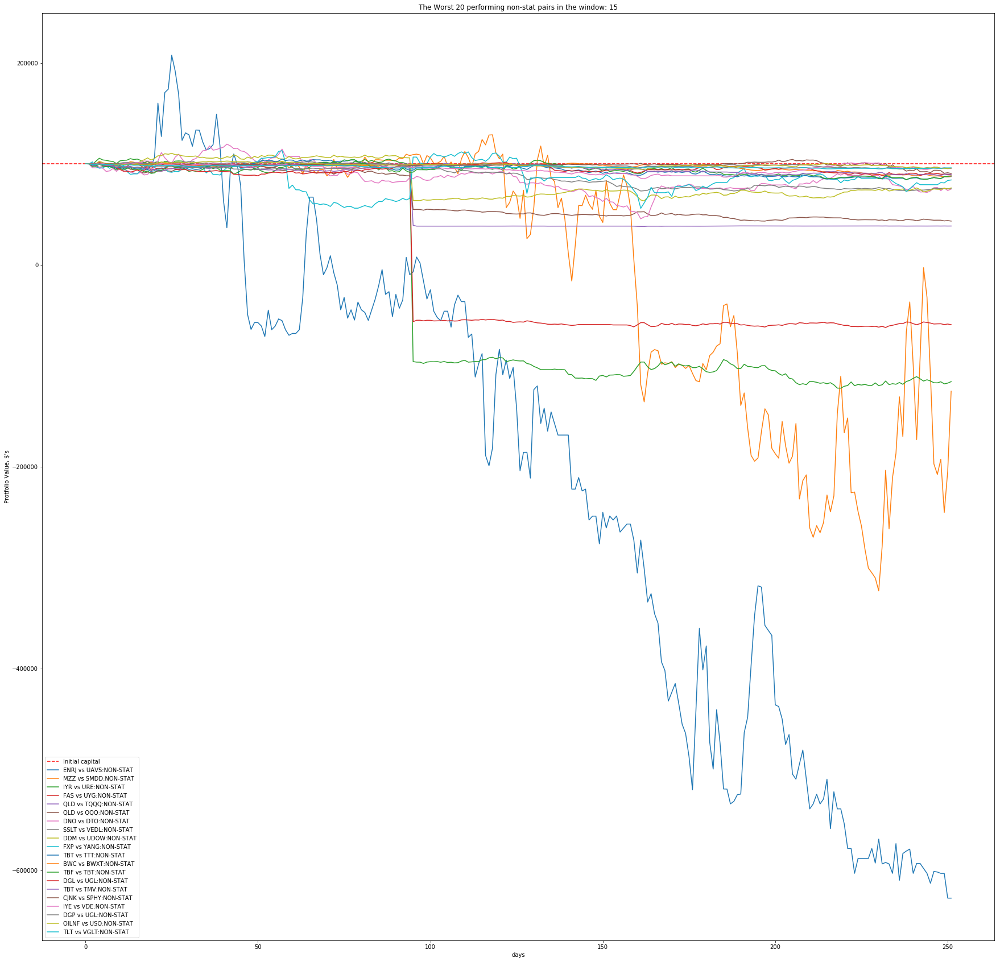

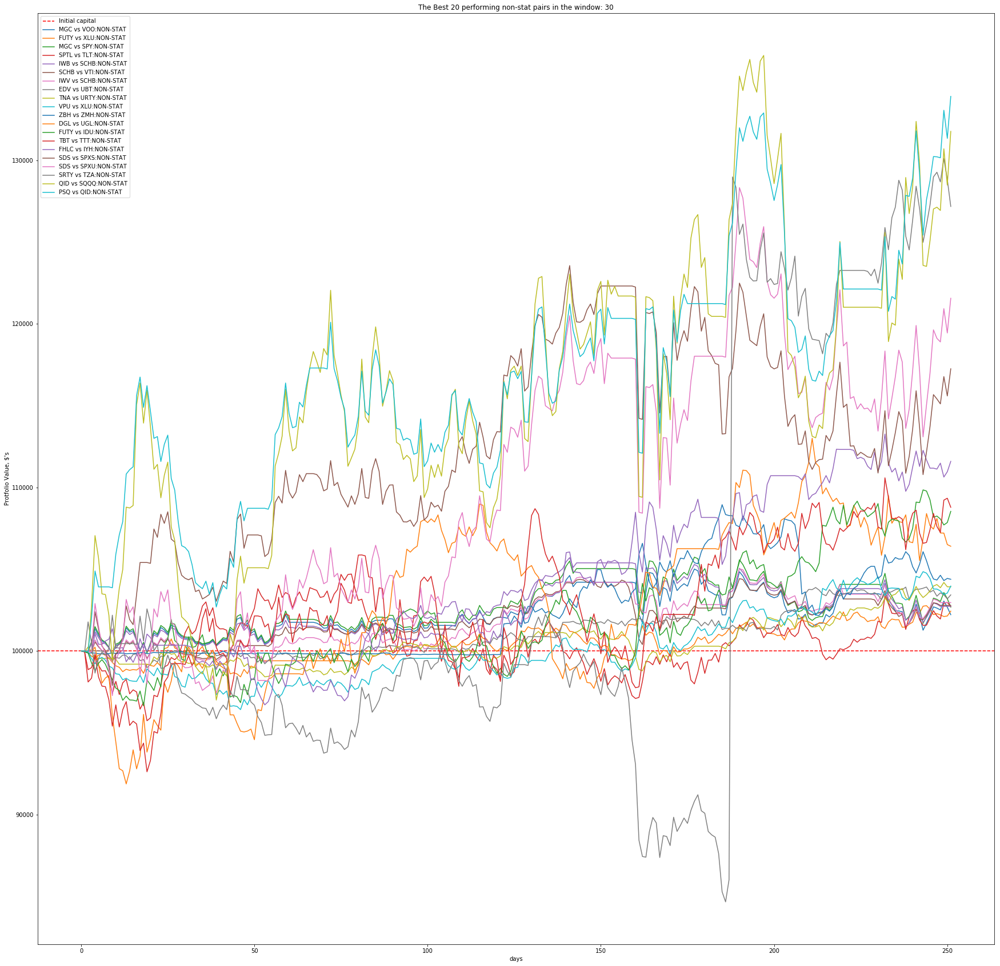

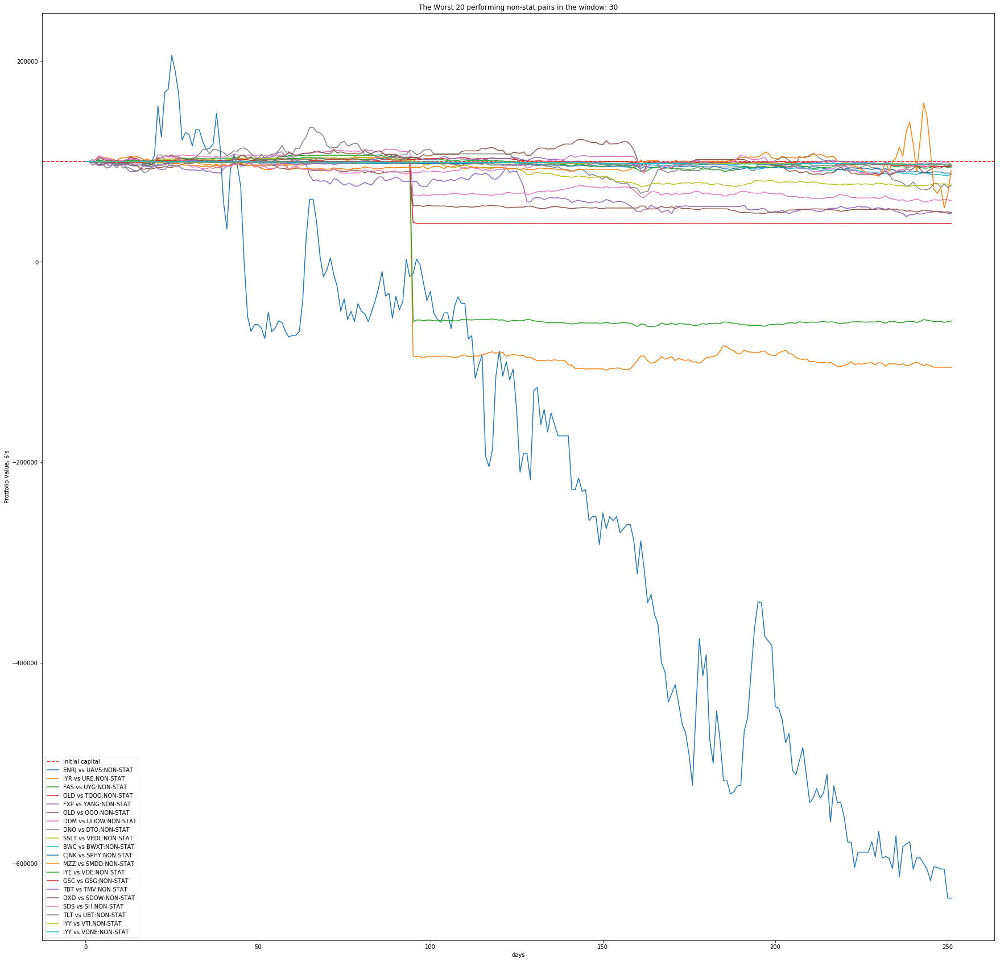

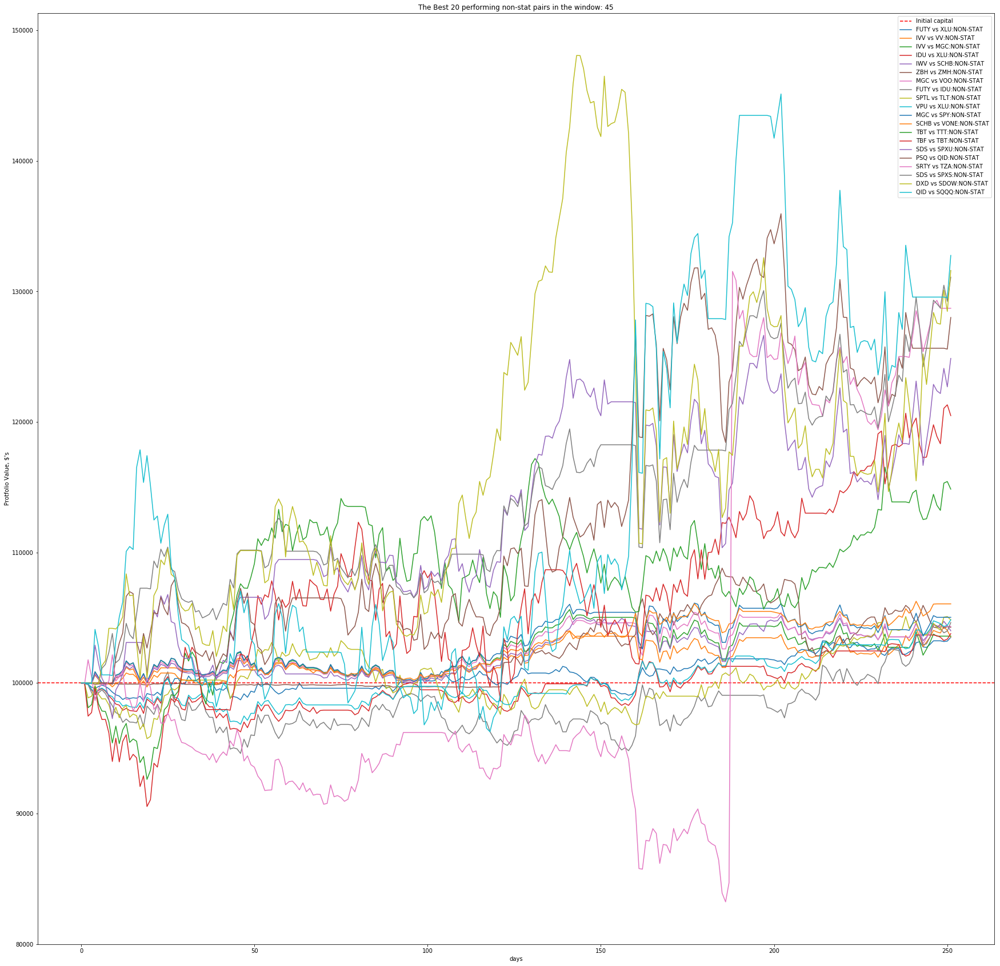

...

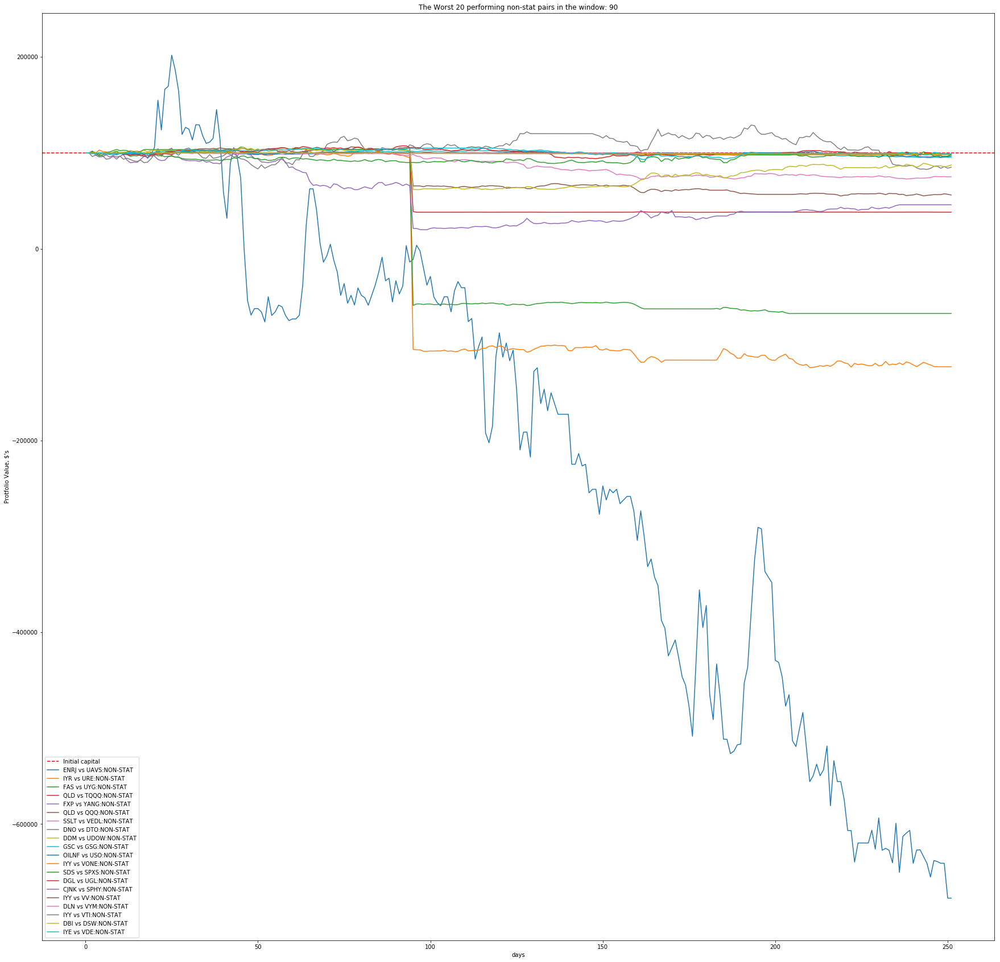

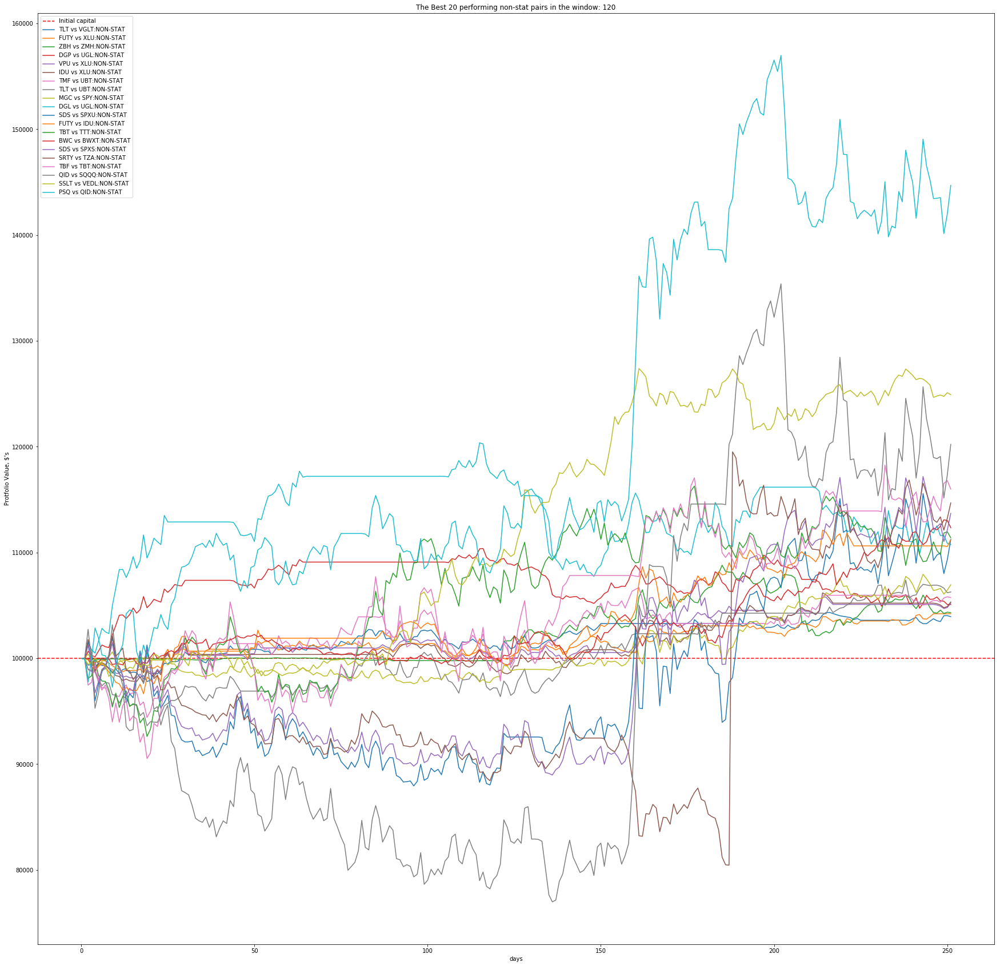

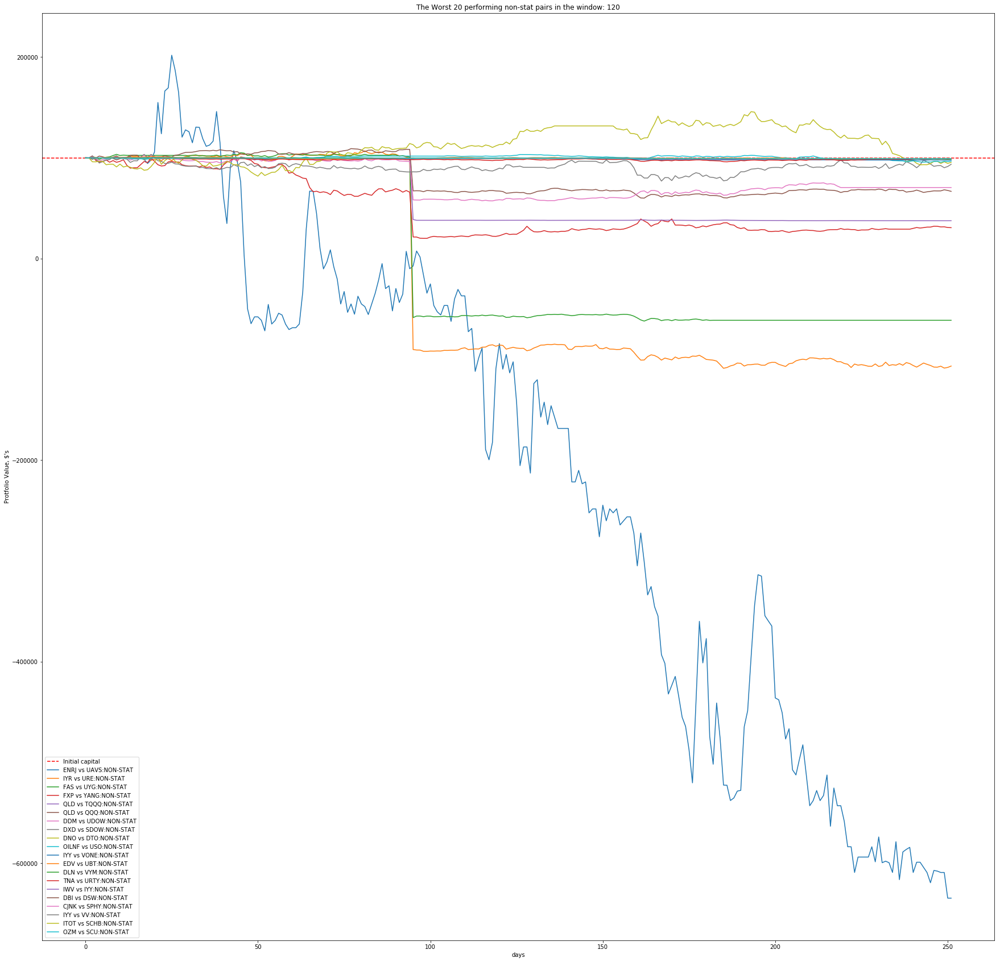

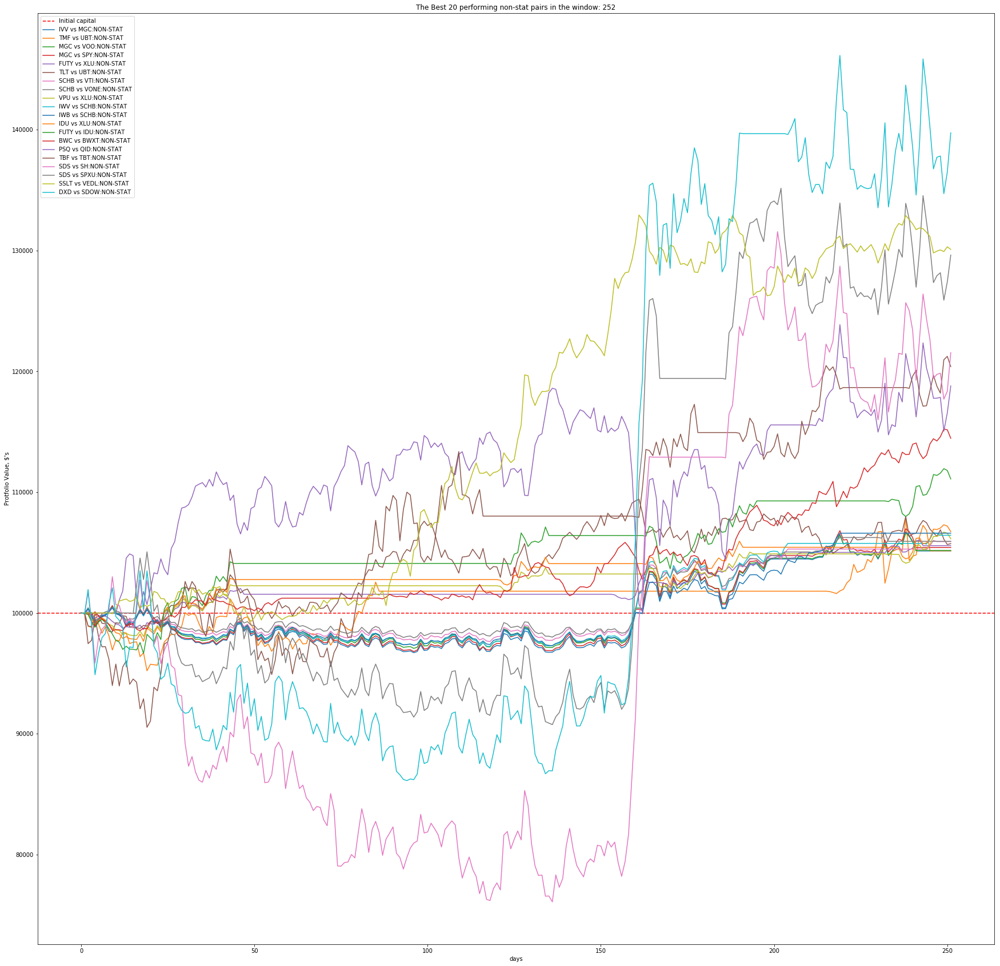

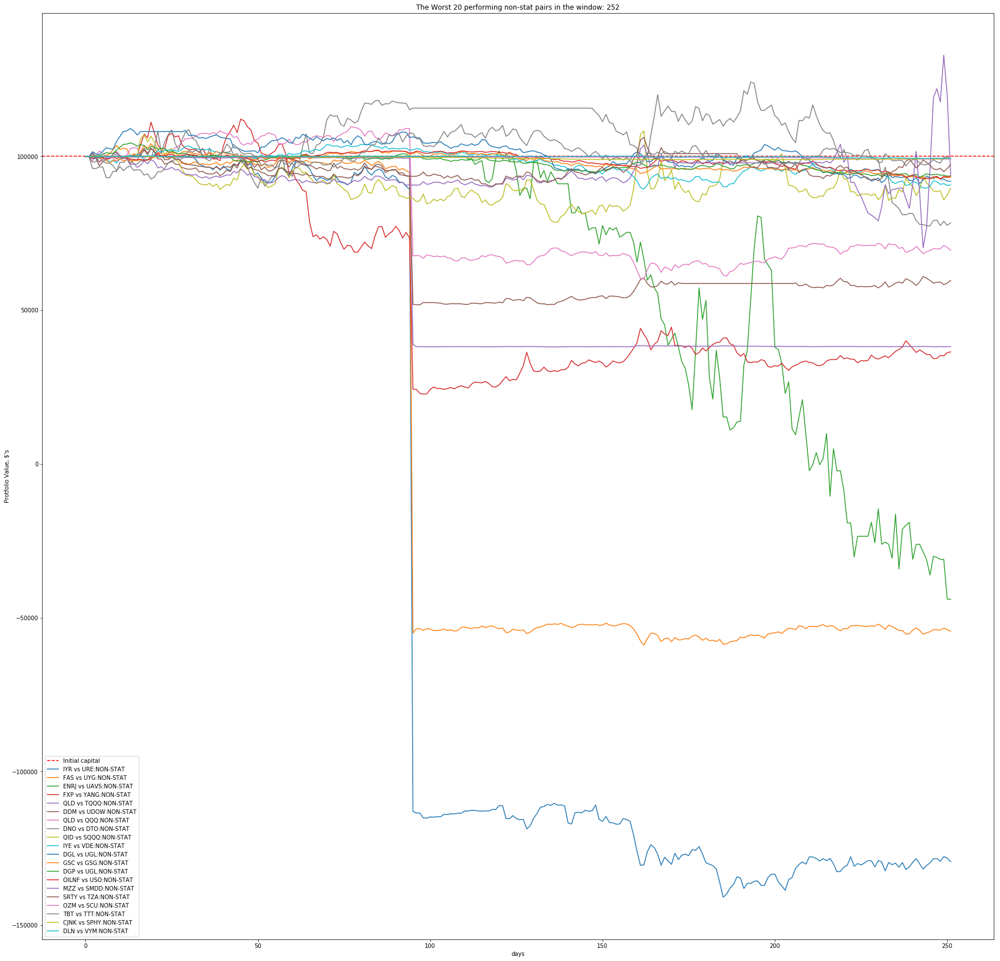

In [6]:
### GETTING NON-STAT AVERAGE RESULTS ### 
nstat_average_perf = OrderedDict()
nstat_pct_mean = OrderedDict()
nstat_pct_std = OrderedDict()
nstat_alpha_mean = OrderedDict()
nstat_beta_mean = OrderedDict()
nstat_sharpe_mean = OrderedDict()
nstat_maxdraw_mean = OrderedDict()

best_20_perf_nstat = OrderedDict()
worst_20_perf_nstat = OrderedDict()

best_20_alpha_nstat = OrderedDict()
best_20_beta_nstat = OrderedDict()
best_20_sharpe_nstat = OrderedDict()
best_20_maxdraw_nstat = OrderedDict()

worst_20_alpha_nstat = OrderedDict()
worst_20_beta_nstat = OrderedDict()
worst_20_sharpe_nstat = OrderedDict()
worst_20_maxdraw_nstat = OrderedDict()

data_len_nstat = len(nstat_data)

for window in windows:
    nstat_average_perf[window] = round(nstat_data['perf_' + str(window)].mean(), 2)
    nstat_pct_mean[window] = round(nstat_data['pct_' + str(window)].mean(), 2)
    nstat_pct_std[window] = round(nstat_data['pct_'+str(window)].std(), 2)
    nstat_alpha_mean[window] = round(nstat_data['alpha_' + str(window)].mean(), 2)
    nstat_beta_mean[window] = round(nstat_data['beta_' + str(window)].mean(), 2)
    nstat_sharpe_mean[window] = round(nstat_data['sharpe_' + str(window)].mean(), 2)
    nstat_maxdraw_mean[window] = round(nstat_data['maxdraw_' + str(window)].mean(), 2)
    
    d = pd.read_csv(file_data + 'pair_sim_window_' + str(window)+'.csv')
    best_idx = [nstat_data['perf_'+str(window)].sort_values()[data_len_nstat-20:data_len_nstat].index[i] for i in range(20)]
    worst_idx = [nstat_data['perf_'+str(window)].sort_values()[:20].index[i] for i in range(20)]
    
    best_20_perf_nstat[window] = [(best_idx[i], d[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_perf_nstat[window] = [(worst_idx[i], d[worst_idx[i]]) for i in range(len(worst_idx))]
    
    best_20_alpha_nstat[window] = [(best_idx[i], nstat_data['alpha_' + str(window)].loc[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_alpha_nstat[window] = [(worst_idx[i], nstat_data['alpha_' + str(window)].loc[worst_idx[i]]) for i in range(len(worst_idx))]
    
    best_20_beta_nstat[window] = [(best_idx[i], nstat_data['beta_' + str(window)].loc[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_beta_nstat[window] = [(worst_idx[i], nstat_data['beta_' + str(window)].loc[worst_idx[i]]) for i in range(len(worst_idx))]

    best_20_sharpe_nstat[window] = [(best_idx[i], nstat_data['sharpe_' + str(window)].loc[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_sharpe_nstat[window] = [(worst_idx[i], nstat_data['sharpe_' + str(window)].loc[worst_idx[i]]) for i in range(len(worst_idx))]
    
    best_20_maxdraw_nstat[window] = [(best_idx[i], nstat_data['maxdraw_' + str(window)].loc[best_idx[i]]) for i in range(len(best_idx))]
    worst_20_maxdraw_nstat[window] = [(worst_idx[i], nstat_data['maxdraw_' + str(window)].loc[worst_idx[i]]) for i in range(len(worst_idx))]
    

#### AVERAGE NON-STAT
colnames = ['average portfolio value', 'average percentage change', 'average standard deviation',
            'average alpha', 'average beta', 'average sharpe ratio', 'average max drawdown']

list_of_dicts = [nstat_average_perf,nstat_pct_mean, nstat_pct_std,
                 nstat_alpha_mean, nstat_beta_mean,nstat_sharpe_mean, nstat_maxdraw_mean ]

main_df = pd.DataFrame()
main_df['window'] = pd.Series(windows)

for i in range(len(list_of_dicts)):
    df = pd.DataFrame(data=list(list_of_dicts[i].items()) , columns=['window', colnames[i]] )
    main_df = pd.concat([main_df, df[colnames[i]]], axis=1)
main_df.to_latex(buf=file_data+'non-stat-perf-windows.txt', index=False)

for window in windows:
    fig, ax = plt.subplots(figsize = (30, 30))
    ax.set_ylabel("Protfolio Value, $'s")
    ax.set_xlabel('days')
    plt.axhline(100000, color='red', ls='--', label='Initial capital')
    plt.title('The Best 20 performing non-stat pairs in the window: {}'.format(window))
    
    for i in range(len(best_20_perf_nstat[window])):
        ax.plot(best_20_perf_nstat[window][i][1])
    plt.legend(loc='best')
    plt.savefig(fname=file_data + 'PLOTS/NON-STAT/best_20_stat_window_' + str(window) + '.png')
    plt.show()
    
    fig1, ax1 = plt.subplots(figsize = (30, 30))
    ax1.set_ylabel("Protfolio Value, $'s")
    ax1.set_xlabel('days')
    plt.axhline(100000, color='red', ls='--', label='Initial capital')    
    
    for i in range(len(worst_20_perf_nstat[window])):
        ax1.plot(worst_20_perf_nstat[window][i][1])
        plt.title('The Worst 20 performing non-stat pairs in the window: {}'.format(window))
    plt.legend(loc='best')
    plt.savefig(fname=file_data + 'PLOTS/NON-STAT/worst_20_stat_window_' + str(window) + '.png')
    plt.show() 

In [8]:
count_aboves_nstat = []
nstat_perf = []
nstat_alpha = []
nstat_beta = []
nstat_sharpe = []
nstat_maxdraw = []

num_of_tradable_pairs = []
for window in windows:
    above = nstat_data[nstat_data['perf_' + str(window)] > 100000]
    nstat_window_best = above[['perf_'+str(window), 'alpha_'+str(window), 'beta_'+str(window),
                         'sharpe_'+str(window), 'maxdraw_'+str(window)]]
    
    nstat_window_best.to_latex(buf=file_data + 'nstat_window_best_' + str(window) + '.txt', index=True)
    count_aboves_nstat.append((window, len(above)))
    
    nstat_perf.append(round(above['perf_'+str(window)].mean(), 2))
    nstat_alpha.append(round(above['alpha_'+str(window)].mean(), 2))
    nstat_beta.append(round(above['beta_'+str(window)].mean(), 2))
    nstat_sharpe.append(round(above['sharpe_'+str(window)].mean(), 2))
    nstat_maxdraw.append(round(above['maxdraw_'+str(window)].mean(), 2))
    print('---- NON-STATONAIRY PAIRS ----')
    print(nstat_window_best)
    
    
count_aboves_stat = []
stat_perf = []
stat_alpha = []
stat_beta = []
stat_sharpe = []
stat_maxdraw = []
for window in windows:
    above = stat_data[stat_data['perf_' + str(window)] > 100000]
    stat_window_best = above[['perf_'+str(window), 'alpha_'+str(window), 'beta_'+str(window),
                         'sharpe_'+str(window), 'maxdraw_'+str(window)]]
    stat_window_best.to_latex(buf=file_data + 'stat_window_best_' + str(window) + '.txt', index=True)
    
    count_aboves_stat.append((window, len(above)))
    
    stat_perf.append(round(above['perf_'+str(window)].mean(), 2))
    stat_alpha.append(round(above['alpha_'+str(window)].mean(), 2))
    stat_beta.append(round(above['beta_'+str(window)].mean(), 2))
    stat_sharpe.append(round(above['sharpe_'+str(window)].mean(), 2))
    stat_maxdraw.append(round(above['maxdraw_'+str(window)].mean(), 2))
    
    print('---- STATIONARY PAIRS ----')
    print(stat_window_best)
    
    
    
count_nstat = pd.DataFrame(data=count_aboves_nstat, columns = ['window', 'count_pos'])
count_nstat['pos %'] = count_nstat.count_pos/len(nstat_data)
count_nstat['avg_perf'] = nstat_perf
count_nstat['avg_alpha'] = nstat_alpha
count_nstat['avg_beta'] = nstat_beta
count_nstat['avg_sharpe'] = nstat_sharpe
count_nstat['avg_maxdraw'] = nstat_maxdraw

count_nstat.to_latex(buf=file_data + 'nstat_count_window.txt', index=False)
print(count_nstat)

count_stat = pd.DataFrame(data=count_aboves_stat, columns = ['window', 'count_pos'])
count_stat['pos %'] = count_stat.count_pos/len(stat_data)
count_stat['avg_perf'] = stat_perf
count_stat['avg_alpha'] = stat_alpha
count_stat['avg_beta'] = stat_beta
count_stat['avg_sharpe'] = stat_sharpe
count_stat['avg_maxdraw'] = stat_maxdraw

count_stat.to_latex(buf=file_data + 'stat_count_window.txt', index=False)
print(count_stat)

---- NON-STATONAIRY PAIRS ----
                      perf_15  alpha_15   beta_15  sharpe_15  maxdraw_15
EDV vs UBT:NON-STAT    102002  0.021147 -0.032479   0.623091   -0.016638
IWV vs SCHB:NON-STAT   109418  0.088551  0.128174   1.595697   -0.021565
SCHB vs VTI:NON-STAT   107219  0.068000  0.124864   1.376295   -0.026431
FUTY vs XLU:NON-STAT   100097  0.001382  0.023757   0.043961   -0.032324
SCHB vs VONE:NON-STAT  100970  0.007795  0.124039   0.223873   -0.037243
IWB vs SCHB:NON-STAT   105105  0.048099  0.137758   0.891297   -0.026978
FHLC vs IYH:NON-STAT   110557  0.101835  0.204699   0.939799   -0.070817
SRTY vs TZA:NON-STAT   161622  0.601382  0.281896   1.047408   -0.132761
QID vs SQQQ:NON-STAT   194477  0.723137  0.304954   2.026498   -0.195170
TLT vs UBT:NON-STAT    101711  0.021940  0.023643   0.213305   -0.054876
SDS vs SPXS:NON-STAT   145118  0.388966  0.185496   1.922735   -0.093074
IDU vs XLU:NON-STAT    100818  0.010347  0.009266   0.151466   -0.050578
MGC vs VV:NON-STAT  

[67 rows x 5 columns]
---- STATIONARY PAIRS ----
                      perf_252  alpha_252  beta_252  sharpe_252  maxdraw_252
IVV vs IWB:STAT         102870   0.031161 -0.078482    0.666994    -0.022593
IWB vs SPY:STAT         103724   0.039423 -0.078765    0.860830    -0.021963
IWB vs SSO:STAT         100973   0.021982 -0.395225    0.168370    -0.053186
CURE vs RXL:STAT        223659   1.406320  0.361142    0.923333    -0.137857
EUSA vs VV:STAT         104627   0.049968 -0.110520    0.737018    -0.029841
FXY vs YCL:STAT    1.02385e+06   8.153321  0.059788    1.047616    -0.379257
SCHG vs VOOG:STAT       104960   0.052448 -0.116392    1.008199    -0.024316
DOG vs DXD:STAT         119686   0.200358 -0.373038    1.254791    -0.075729
SBND vs TTT:STAT        132963   0.318998  0.703918    1.048054    -0.163677
ITOT vs VOO:STAT        110800   0.112423 -0.219345    1.123363    -0.047436
SSO vs VOO:STAT         143252   0.429765 -0.094795    1.029601    -0.020529
IWL vs MGC:STAT         104